My Inspiration for this was https://youtu.be/k-gin1qfzi0

The data is scrapped from BiggerPockets's Podcast series

In [1]:
from bs4 import BeautifulSoup
from bs4.dammit import EncodingDetector
import requests
from wordcloud import WordCloud, ImageColorGenerator, STOPWORDS
import matplotlib.pyplot as plt 
from PIL import Image
from os import path, getcwd
import numpy as np
import seaborn as sns

import nltk
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

In [2]:
nltk.download('stopwords')
nltk.download('punkt')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [3]:
def get_soup(html):
    """ get data for web page"""
    resp = requests.get(html)
    http_encoding = resp.encoding if 'charset' in resp.headers.get('content-type', '').lower() else None
    html_encoding = EncodingDetector.find_declared_encoding(resp.content, is_html=True)
    encoding = html_encoding or http_encoding
    soup = BeautifulSoup(resp.content, from_encoding=encoding)
    return soup

In [4]:
#webpage 
bp_transcripts = 'https://www.biggerpockets.com/podcast-transcripts'

#gets word soup from website 
soupout = get_soup(bp_transcripts)
soupout.prettify

<bound method Tag.prettify of <!DOCTYPE html>
<html class="no-js unknown-user-agent" lang="en">
<head>
<title>BiggerPockets Podcast Transcripts</title>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<meta charset="utf-8"/>
<meta content="IE=edge,chrome=1" http-equiv="X-UA-Compatible"/>
<meta content="Copyright (c)2004-2022 BiggerPockets, LLC." name="copyright"/>
<meta content="index, follow" name="robots"/>
<meta description="Read complete episodes of the BiggerPockets Podcast via transcripts of the top rated and reviewed real estate investing show"/>
<meta content="BiggerPockets Podcast Transcripts" poperty="og:title"/>
<link href="https://www.biggerpockets.com/assets/logo/logoman-white-bg-180-35e66103c974c89722567d4713ce991cb0f11795fa5751b6d24c8573bf2421bf.png" rel="apple-touch-icon"/>
<link href="https://www.biggerpockets.com/assets/logo/logoman-white-bg-180-35e66103c974c89722567d4713ce991cb0f11795fa5751b6d24c8573bf2421bf.png" rel="apple-touch-icon" sizes="180

In [5]:
def get_links(soup):
    """ Get links from a web page """
    http_link_list = [] 
    for link in soup.find_all('a', href=True):
        if link['href'][0] != '/': 
            http_link_list.append(link['href'].strip("'"))
    return http_link_list 

In [6]:
#gets links from website     
h_links = get_links(soupout)
h_links

['https://www.biggerpockets.com/',
 'https://get.biggerpockets.com/nreig/',
 'https://get.biggerpockets.com/tenant-screening/',
 'https://get.biggerpockets.com/forms/index',
 'http://biggerpockets.foreclosure.com/',
 'https://store.biggerpockets.com/products/rental-property-investing',
 'https://store.biggerpockets.com/products/short-term-rental-long-term-wealth',
 'https://store.biggerpockets.com/products/the-multifamily-millionaire-volume-i',
 'https://store.biggerpockets.com/products/buy-rehab-rent-refinance-repeat',
 'https://www.biggerpockets.com/store',
 'http://www.biggerpockets.com/podcast',
 'https://www.biggerpockets.com/bpp159-nathan-brooks-podcast-transcript-how-to-build-real-estate-business-sixty-deals-a-year',
 'https://www.biggerpockets.com/bpp158-jeff-decarlo-podcast-transcript-blueprint-for-building-your-estate-deal-pipeline',
 'https://www.biggerpockets.com/bpp157-hal-elrod-podcast-transcript-morning-miracle-how-to-dominate-your-mornings',
 'https://www.biggerpockets.

In [7]:
#trims to only relevant links
html_links = h_links[5:163]
html_links

['https://store.biggerpockets.com/products/rental-property-investing',
 'https://store.biggerpockets.com/products/short-term-rental-long-term-wealth',
 'https://store.biggerpockets.com/products/the-multifamily-millionaire-volume-i',
 'https://store.biggerpockets.com/products/buy-rehab-rent-refinance-repeat',
 'https://www.biggerpockets.com/store',
 'http://www.biggerpockets.com/podcast',
 'https://www.biggerpockets.com/bpp159-nathan-brooks-podcast-transcript-how-to-build-real-estate-business-sixty-deals-a-year',
 'https://www.biggerpockets.com/bpp158-jeff-decarlo-podcast-transcript-blueprint-for-building-your-estate-deal-pipeline',
 'https://www.biggerpockets.com/bpp157-hal-elrod-podcast-transcript-morning-miracle-how-to-dominate-your-mornings',
 'https://www.biggerpockets.com/bpp156-mark-spidell-podcast-transcript-lifestyle-engerineering-commercial-residential-vacation-rentals',
 'https://www.biggerpockets.com/bpp155-sharad-mehta-podcast-transcript-from-zero-to-two-hundreds-deals-in-f

In [8]:
def get_ps(soup):
    """ get <p> tags from web page"""
    http_link_list = [] 
    for link in soup.find_all('p'):
        http_link_list.append(link.get_text())
    return http_link_list 

In [9]:
def get_text(text_array):
    """ get text from an array"""
    text = " ".join(text_array)
    return text

In [10]:
def get_episode_text(episode_list):
    """get text from all episodes in list"""
    text_return = []
    for i in episode_list:
        print(i)
        soup = get_soup(i)
        text_array = get_ps(soup)
        full_text = get_text(text_array)
        text_return.append(full_text)
    return text_return

In [11]:
def punctuation_stop(text):
    """remove punctuation and stop words"""
    filtered = []
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(text)
    for w in word_tokens:
        if w not in stop_words and w.isalpha():
            filtered.append(w.lower())
    return filtered

In [12]:
#return list of all episode text 
text_return_list = get_episode_text(html_links)
all_text = get_text(text_return_list)
all_text

https://store.biggerpockets.com/products/rental-property-investing
https://store.biggerpockets.com/products/short-term-rental-long-term-wealth
https://store.biggerpockets.com/products/the-multifamily-millionaire-volume-i
https://store.biggerpockets.com/products/buy-rehab-rent-refinance-repeat
https://www.biggerpockets.com/store
http://www.biggerpockets.com/podcast
https://www.biggerpockets.com/bpp159-nathan-brooks-podcast-transcript-how-to-build-real-estate-business-sixty-deals-a-year
https://www.biggerpockets.com/bpp158-jeff-decarlo-podcast-transcript-blueprint-for-building-your-estate-deal-pipeline
https://www.biggerpockets.com/bpp157-hal-elrod-podcast-transcript-morning-miracle-how-to-dominate-your-mornings
https://www.biggerpockets.com/bpp156-mark-spidell-podcast-transcript-lifestyle-engerineering-commercial-residential-vacation-rentals
https://www.biggerpockets.com/bpp155-sharad-mehta-podcast-transcript-from-zero-to-two-hundreds-deals-in-five-years
https://www.biggerpockets.com/bp

'ALL free bonus content ALL free bonus content ALL free bonus content More than half a million copies sold worldwide. Everything you need to fast-track your way to financial freedom with rental properties! Real estate investing can provide a safe and fast path to financial freedom, and this business best seller will show you exactly how to get there. With nearly 400 pages of in-depth advice,\xa0The Book on Rental Property Investing\xa0imparts practical and exciting strategies that real estate investors across the world are using to build significant cash flow with rental properties. Brandon Turner—active real estate investor, best-selling author, and co-host of the\xa0BiggerPockets Podcast—breaks down the time-tested strategies he used to build his own wealth in real estate. Whether you are just getting started or already own hundreds of units, you will learn how to create an achievable plan, find incredible deals, analyze properties, build a team, finance rentals, and much more—everyt

In [13]:
#removed punctuation and stop words 
filteredlst = punctuation_stop(all_text)

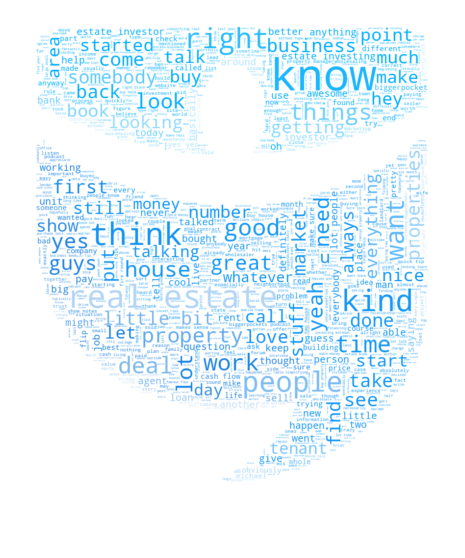

In [14]:
#list of unwanted words 
unwanted = ['brandon','josh','one','guy','really','mean','little bit','thing','say','go','actually','even','probably','going','said','something','okay','maybe','got','well','way']

#remove unwanted words 
text = " ".join([ele for ele in filteredlst if ele not in unwanted])

#get the working directory 
d = getcwd()

#numpy image file of mask image 
mask_logo = np.array(Image.open(path.join(d, "/work/Bigger_Pockets_Logo4.png")))

#create the word cloud object 
wc= WordCloud(background_color="white", max_words=2000, max_font_size=90, random_state=1, mask=mask_logo, stopwords=STOPWORDS)
wc.generate(text)

image_colors = ImageColorGenerator(mask_logo)

plt.figure(figsize=[10,10])
plt.imshow(wc.recolor(color_func=image_colors), interpolation="bilinear")
plt.axis('off')
plt.show()

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=7e576f05-c0cc-45b1-ab63-98df1db8dfb0' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>